In [ ]:
import sys
import os
sys.path.append('../shared/')
import GalaxyMeasurements

import numpy as np
import random
import math
from scipy.spatial import distance_matrix
import pandas as pd
from pandasql import sqldf
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MultipleLocator, FormatStrFormatter, AutoMinorLocator
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from scipy import integrate
from tqdm import tqdm

from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import SqrtStretch, simple_norm, LogStretch, MinMaxInterval, AsinhStretch, LinearStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u
from astropy.modeling.models import Gaussian1D, Moffat1D, Gaussian2D
from astropy.coordinates import Distance, Angle
from astropy import constants
from astropy.convolution import convolve, convolve_fft, Gaussian2DKernel
from astropy.stats import gaussian_fwhm_to_sigma

from photutils.psf import MoffatPSF
from photutils.datasets import apply_poisson_noise
from shapely import difference, contains
from shapely.geometry import Point, Polygon
from shapely.geometry.multipolygon import MultiPolygon
import pointpats

import fsps
from sedpy import observate

In [ ]:
DATA_PATH = './data/'

PREDICTIONS_FILE_PATH = './predictions/'
PHOTOMETRY_FILE_PATH = './photometry/'

DATA_BACKUP_PATH = os.environ['HOME'] + '/Data_Backup/'

IMAGE_DATA_PATH = DATA_BACKUP_PATH + 'HSC_CLAUDS_Zoobot_FRCNN_wide/'
DATA_PATH_CLAUDS = DATA_BACKUP_PATH + 'CLAUDS/'

FITS_FILE_PATH = IMAGE_DATA_PATH + 'HSC_fits/'
FITS_FILE_OUT_PATH = IMAGE_DATA_PATH + 'HSC_fits_simclumps_2/'

HSC_PNG_PATH = DATA_BACKUP_PATH + 'HSC_CLAUDS_Zoobot_FRCNN_wide/HSC_png/'
SINGLEBAND_PNG_PATH = DATA_BACKUP_PATH + 'HSC_CLAUDS_Zoobot_FRCNN_wide/HSC_singleband_png_400x400/'
PSF_FILE_PATH = DATA_BACKUP_PATH + 'HSC_CLAUDS_Zoobot_FRCNN_wide/HSC_psf/'

HSC_ARCSEC_PER_PIXEL = 0.168
SCORE_THRESHOLD = 0.0
FLUXMAG0 = 63095734448.01944
FLUXMAG0_CLAUDS = 10**(30/2.5)

## Data

In [97]:
# read model predictions, bounding boxes
# galaxies: 712,207
# count: 6,984,871
# unique: 6,984,871
df_preds = pd.read_parquet(PREDICTIONS_FILE_PATH + 'preds_Zoobot-U+GRIZY_combined_ensemble_nms_cleaned.gzip', engine='pyarrow')

In [ ]:
# read galaxies
# galaxies: 14,309

objids_exclusion = HSCobjids_to_exclude.objids_exclusion

cols_HSC = [
    'HSCobjid', 'ra', 'dec', 'tract', 'patch', 'SDSS_field', 'skymap_id', 
    'u_cmodel_flux', 'g_cmodel_flux', 'r_cmodel_flux', 'i_cmodel_flux', 'z_cmodel_flux', 'y_cmodel_flux', 
    'u_cmodel_fluxerr', 'g_cmodel_fluxerr', 'r_cmodel_fluxerr', 'i_cmodel_fluxerr', 'z_cmodel_fluxerr', 'y_cmodel_fluxerr', 
    'u_cmodel_mag', 'g_cmodel_mag', 'r_cmodel_mag', 'i_cmodel_mag', 'z_cmodel_mag', 'y_cmodel_mag', 
    'u_cmodel_magerr', 'g_cmodel_magerr', 'r_cmodel_magerr', 'i_cmodel_magerr', 'z_cmodel_magerr', 'y_cmodel_magerr', 
    'useeing', 'gseeing', 'rseeing', 'iseeing', 'zseeing', 'yseeing', 
    'demp_photoz_best', 'demp_photoz_risk_best', 'demp_stellar_mass', 'demp_sfr', 'demp_specsfr', 
    'dnnz_photoz_best', 'dnnz_photoz_risk_best', 
    'mizuki_photoz_best', 'mizuki_photoz_risk_best', 'mizuki_stellar_mass', 'mizuki_sfr', 
    'bpt_class', 'galaxy_lmass', 'galaxy_lsfr', 'galaxy_lspecsfr', 
    'GRIZY_exists', 'U_band_exists', 'PSF_GRIZY_exists', 'PSF_U_band_exist', 'is_data_U', 'is_clean_U', 
    'reference_band', 'reference_psf_fwhm', 'is_star_forming',
    'redshift', 'is_specz', 'specz_redshift', 'specz_redshift_err', 
    'SDSS_redshift', 'SDSS_redshift_error', 'petroR90_r', 'petroMag_r',
    'kpc_scale', 'kpc_scale_px', 'gal_mass', 'gal_sSFR'
]

df_galaxies = (pd
    .read_parquet(DATA_PATH + 'galaxies_HSCfull.gzip', engine='pyarrow')
    [cols_HSC]
    .query('GRIZY_exists==True & U_band_exists==True & PSF_U_band_exist==True & is_data_U==True')
    # .query('GRIZY_exists & PSF_GRIZY_exists') # HSC only
    .query('HSCobjid not in @objids_exclusion')
    .query('reference_psf_fwhm==reference_psf_fwhm')
    .query('kpc_scale_px < 20')
)

In [4]:
# read model predictions, bounding boxes
# galaxies: 14,308
# count: 145,036
# unique: 145,036

cols_preds = [
    'HSCobjid', 'boxes', 'labels', 'scores', 'px_x1', 'px_y1',
    'px_x2', 'px_y2', 'px_centre_x', 'px_centre_y', 'px_x1_normed',
    'px_y1_normed', 'px_x2_normed', 'px_y2_normed', 'is_central',
    # 'px_fits_x', 'px_fits_y',
    'clump_diameter', 'clump_id', 'detection_id',
]

df_preds = (pd
    .read_parquet(PREDICTIONS_FILE_PATH + 'preds_Zoobot-U+GRIZY_combined_ensemble_nms_cleaned.gzip', engine='pyarrow')
    [cols_preds]
    .merge(df_galaxies[['HSCobjid', 'redshift', 'is_specz', 'kpc_scale_px']], how='inner', on='HSCobjid')
    .assign(clump_diameter_kpc = lambda __df: __df.clump_diameter / __df.kpc_scale_px)
)

In [5]:
# read identified peaks in bboxes
# galaxies: 7,218
# count: 184,830
# unique: 184,830
df_peaks = pd.read_parquet(PREDICTIONS_FILE_PATH + 'peaks_Zoobot-U+GRIZY_ensemble_CLAUDS+HSC_bands_sigma_1.0_cleaned.gzip', engine='pyarrow')

In [819]:
# read surface brightness profiles and parameters for peaks
# galaxies: 7,218
# count: 1,108,980, thereof w/o Moffat fit: 245,685
# unique: 184,830
# count of only those with Moffat FWHM <= seeing: 276,174
# count of only those with Moffat FWHM <= 2*seeing: 587,745
# count, only those with Moffat FWHM <= seeing and redshift <= 0.5: 275,012
# final count, only those with Moffat FWHM <= 2*seeing and redshift <= 0.5: 585,471
df_peak_profiles = (pd
    .read_parquet(PHOTOMETRY_FILE_PATH + 'srfbright_Zoobot-U+GRIZY_ensemble_HSC_sigma_1.0.gzip', engine='pyarrow')
    .query('moffat_fwhm == moffat_fwhm')
    # .query('moffat_fwhm <= 2*seeing')
    .merge(df_galaxies[['HSCobjid', 'redshift', 'is_specz', 'kpc_scale', 'kpc_scale_px']], how='inner', on='HSCobjid')
    .assign(moffat_fwhm_kpc = lambda __df: __df.moffat_fwhm / __df.kpc_scale_px)
    .assign(moffat_fwhm_seeing = lambda __df: __df.moffat_fwhm / __df.seeing)
    # .query('redshift <= 0.5')
)

df_peak_profiles['redshift_class'] = pd.cut(df_peak_profiles['redshift'], bins=[-np.inf, 0.1, 0.2, 0.3, 0.4, 0.5, np.inf])

In [400]:
gal_cols = ['HSCobjid', 'redshift', 'kpc_scale', 'kpc_scale_px', 'gal_mass', 'gal_sSFR', 'petroR90_r']
df_stat = (df_peaks
    .merge(df_galaxies[gal_cols], how='inner', on='HSCobjid')
    .groupby(['HSCobjid', 'band', 'clump_id', 'redshift', 'kpc_scale_px', 'gal_mass', 'gal_sSFR', 'petroR90_r'])
    .agg({
        'peak_detection_id': 'count'
    })
    .reset_index()
    .groupby(['HSCobjid', 'band', 'redshift', 'kpc_scale_px', 'gal_mass', 'gal_sSFR', 'petroR90_r', 'peak_detection_id'])
    .agg({
        'clump_id': 'count'
    })
    .reset_index()
    .rename(columns={
        'peak_detection_id': 'peak_count',
        'clump_id': 'clump_count'
    })
)

df_stat['redshift_class'] = pd.cut(df_stat['redshift'], bins=[-np.inf, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.4, 0.45, 0.50, np.inf])

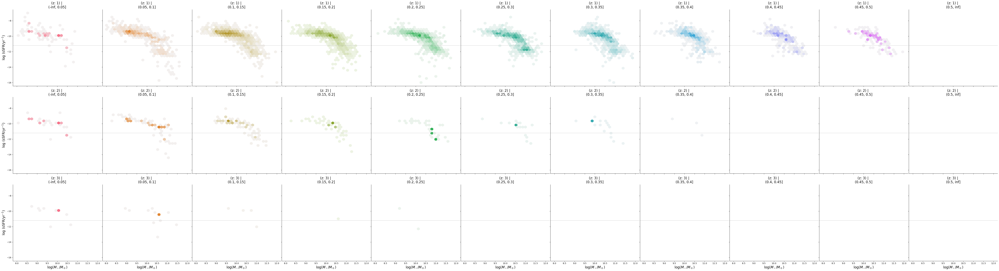

In [401]:
def hexbin(x, y, color, **kwargs):
    cmap = sns.light_palette(color, as_cmap=True)
    plt.hexbin(
        x, y, 
        gridsize=30, 
        cmap=cmap, 
        bins=20,
        mincnt=1,
        **kwargs
    )

g = sns.FacetGrid(df_stat[(df_stat['peak_count']<4) & (df_stat['band']=='R')], hue='redshift_class', col='redshift_class', row='peak_count', height=6, aspect=1)
(g
    .map(hexbin, 'gal_mass', 'gal_sSFR', extent=[8, 12, -16, -7])
    .set_axis_labels(r'$\log (M_\star / M_\odot)$', r'$\log \,(\mathrm{sSFR} / \mathrm{yr}^{-1})$', fontsize=16)
    .set_titles(col_template='\n{col_name}', row_template='(z: {row_name})', size=16)
    .tight_layout(w_pad=0)
    .despine()
)

for ax in g.axes.flatten():
    ax.axhline(y=-11.2, color='.7', ls='--', lw=1)

## Parameter space for number of peaks per clump depending on redshift, galaxy mass and sSFR

In [402]:
gal_cols = ['HSCobjid', 'redshift', 'kpc_scale', 'kpc_scale_px', 'gal_mass', 'gal_sSFR', 'petroR90_r']
df_stat = (df_peaks
    .merge(df_galaxies[gal_cols], how='inner', on='HSCobjid')
    .groupby(['HSCobjid', 'band', 'clump_id', 'redshift', 'kpc_scale_px', 'gal_mass', 'gal_sSFR', 'petroR90_r'])
    .agg({
        'peak_detection_id': 'count'
    })
    .reset_index()
    .groupby(['HSCobjid', 'band', 'redshift', 'kpc_scale_px', 'gal_mass', 'gal_sSFR', 'petroR90_r', 'peak_detection_id'])
    .agg({
        'clump_id': 'count'
    })
    .reset_index()
    .rename(columns={
        'peak_detection_id': 'peak_count',
        'clump_id': 'clump_count'
    })
    .pivot(
        columns='peak_count',
        index=['HSCobjid', 'band', 'redshift', 'kpc_scale_px', 'gal_mass', 'gal_sSFR', 'petroR90_r'],
        values='clump_count'
    )
    .reset_index()
    .rename(columns={
        1 : 'peaks_1',
        2 : 'peaks_2',
        3 : 'peaks_3',
        4 : 'peaks_4',
        5 : 'peaks_5',
        6 : 'peaks_6',
        7 : 'peaks_7',
        8 : 'peaks_8',
        9 : 'peaks_9',
        10: 'peaks_10',
    })
    .fillna(0.0)
    .assign(peaks_9 = 0.0)
    .assign(clump_sum = lambda _df: _df.iloc[:, -10:-1].sum(axis=1))
)

data = df_stat[df_stat['band']=='R']['redshift']
df_stat['redshift_class'] = pd.cut(df_stat['redshift'], bins=[0.0, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.4, 0.45, 0.50, max(data) + 0.5])
data = df_stat[df_stat['band']=='R']['gal_mass']
df_stat['galaxy_mass_class'] = pd.cut(df_stat['gal_mass'], bins=np.arange(min(data), max(data) + 0.5, 0.5))
data = df_stat[df_stat['band']=='R']['gal_sSFR']
df_stat['galaxy_sSFR_class'] = pd.cut(df_stat['gal_sSFR'], bins=np.arange(min(data), max(data) + 0.5, 0.5))

df_stat = (df_stat
    .groupby(['redshift_class', 'galaxy_mass_class', 'galaxy_sSFR_class'], as_index=False, observed=True)
    .agg({
        'peaks_1': 'sum',
        'peaks_2': 'sum',
        'peaks_3': 'sum',
        'peaks_4': 'sum',
        'peaks_5': 'sum',
        'peaks_6': 'sum',
        'peaks_7': 'sum',
        'peaks_8': 'sum',
        'peaks_9': 'sum',
        'peaks_10': 'sum',
        'clump_sum': 'sum'
    })
    .assign(prob_peaks_1  = lambda _df: _df.peaks_1 / _df.clump_sum)
    .assign(prob_peaks_2  = lambda _df: _df.peaks_2 / _df.clump_sum)
    .assign(prob_peaks_3  = lambda _df: _df.peaks_3 / _df.clump_sum)
    .assign(prob_peaks_4  = lambda _df: (_df.peaks_4+_df.peaks_5+_df.peaks_6+_df.peaks_7+_df.peaks_8+_df.peaks_9+_df.peaks_10) / _df.clump_sum)
    .reset_index(drop=True)
)

df_stat['redshift_class_lower'] = df_stat['redshift_class'].apply(lambda x: x.left).astype(float)
df_stat['redshift_class_upper'] = df_stat['redshift_class'].apply(lambda x: x.right).astype(float)
df_stat['galaxy_mass_class_lower'] = df_stat['galaxy_mass_class'].apply(lambda x: x.left).astype(float)
df_stat['galaxy_mass_class_upper'] = df_stat['galaxy_mass_class'].apply(lambda x: x.right).astype(float)
df_stat['galaxy_sSFR_class_lower'] = df_stat['galaxy_sSFR_class'].apply(lambda x: x.left).astype(float)
df_stat['galaxy_sSFR_class_upper'] = df_stat['galaxy_sSFR_class'].apply(lambda x: x.right).astype(float)

df_stat = df_stat[[
    'redshift_class_lower', 'redshift_class_upper',
    'galaxy_mass_class_lower', 'galaxy_mass_class_upper',
    'galaxy_sSFR_class_lower', 'galaxy_sSFR_class_upper',
    'prob_peaks_1', 'prob_peaks_2', 'prob_peaks_3', 'prob_peaks_4'
]]

df_stat.to_parquet(DATA_PATH + 'LoT_peaks_per_clumps.gzip', compression='gzip')

# Simulate clumps/peaks

In [ ]:
def random_points_around_point(x_centre, y_centre, max_radius):
    """
      Creates a random point within max_radius around a given 
      point with x_centre, y_centre

      Args:
      x_centre, y_centre : coordinates of the central point
      max_radius : radius describing the annulus in which the 
        random point is laying where the annulus is ranging 
        from max_radius/2 to max_radius

      Returns:
      x, y : coordinates of the random point
    """

    alpha = 2 * math.pi * random.random() # random angle
    r = max_radius - (max_radius/2 * math.sqrt(random.random())) # random radius
    # calculating coordinates
    x = r * math.cos(alpha) + x_centre
    y = r * math.sin(alpha) + y_centre

    return x, y


def jitter_points(x_centre, y_centre, radius, probs=[0.5, .25, 0.2, 0.05]):
    """
      Creates a random point within a radius which is multiplied 
      by the given probabilities around a given point with 
      x_centre, y_centre.
      Currently, only four different multiplier are applicable.

      Args:
      x_centre, y_centre : coordinates of the central point
      radius : radius describing the circle in which the random point is laying
      probs : array of the four probabilities for the radius multiplier

      Returns:
      x, y : coordinates of the random point
    """

    # radius_multiplier = np.random.choice([1, 2, 3, 4], 1, p=probs)[0]
    radius_multiplier = np.random.choice([i for i in range(len(probs))], 1, p=probs)[0]

    alpha = 2 * math.pi * random.random() # random angle
    r = radius * radius_multiplier
    # calculating coordinates
    x = r * math.cos(alpha) + x_centre
    y = r * math.sin(alpha) + y_centre

    return x, y


def create_random_peak_positions(
        no_of_initial_clump_clusters, 
        min_distance, 
        prob_peak_per_clump_cluster, 
        host_galaxy_polygon, 
        host_galaxy_dict,
        image_shape,
        wcs,
        pixel_scale=1/HSC_ARCSEC_PER_PIXEL
    ):
    """
      Function to output random xy-positions for a number of peaks.

      Args:

      Returns:
        dataframe with
          'HSCobjid' : object-ID from HSC PDR3
          'band' : filterband the peak is positioned, one of UGRIZY
          'clump_id' : clump cluster ID
          'peak_id' : single peak/clump ID
          'x_centroid' : x-coord in px
          'y_centroid' : y-coord in px
          'gal_mass' : log10(M/M_sol) of the host galaxy
          'gal_z' : redshift of the host galaxy
          'seeing_px' : worst seeing in px over all filterbands
          'kpc_scale_px' : 1 kpc in px
    """

    # unpack host_galaxy_dict
    objid = host_galaxy_dict['objid']
    kpc_scale_px = host_galaxy_dict['kpc_scale'] * pixel_scale
    galaxy_z = host_galaxy_dict['redshift']
    galaxy_mass = host_galaxy_dict['galaxy_mass']
    galaxy_seeing = {
        'U': host_galaxy_dict['useeing'],
        'G': host_galaxy_dict['gseeing'],
        'R': host_galaxy_dict['rseeing'],
        'I': host_galaxy_dict['iseeing'],
        'Z': host_galaxy_dict['zseeing'],
        'Y': host_galaxy_dict['yseeing'],
    }
    seeing_px = host_galaxy_dict['reference_psf_fwhm'] * pixel_scale

    # Generates n points inside polygon
    _clump_pos = pointpats.random.normal(host_galaxy_polygon, size=no_of_initial_clump_clusters)

    # remove those points which are too close to each other
    d_matrix = distance_matrix(_clump_pos, _clump_pos)
    idx_to_remove = np.unique(np.sort(np.argwhere((d_matrix <= min_distance) & (d_matrix > 0.0)), axis=1), axis=0)[:,1]
    clump_pos = np.delete(_clump_pos, idx_to_remove, 0)

    # generate the peaks
    list_of_positions = []
    for clump_id, pt in enumerate(clump_pos):
        # determine if we've got multiple peaks per clump
        no_of_peaks = np.random.choice([i for i in range(1, len(prob_peak_per_clump_cluster)+1)], 1, p=prob_peak_per_clump_cluster)
        
        # add the initial position for U-band and GRIZY
        ra, dec = wcs.all_pix2world(pt[0], pt[1], 0)
        x_centroid_normed = pt[0]/image_shape[0]
        y_centroid_normed = pt[1]/image_shape[1]

        # no jittering of positions
        for band in 'UGRIZY':
            # list_of_positions.append([objid, band, clump_id+1, 1, pt[0], pt[1], ra, dec, x_centroid_normed, y_centroid_normed, galaxy_mass, galaxy_z, galaxy_seeing[band]*pixel_scale, kpc_scale_px, peak_mass])
            list_of_positions.append([objid, band, clump_id+1, 1, pt[0], pt[1], ra, dec, x_centroid_normed, y_centroid_normed, galaxy_mass, galaxy_z, galaxy_seeing[band]*pixel_scale, kpc_scale_px])
        
        # # with a chance of the GRIZY positions being displaced/jittered from original position
        # list_of_positions.append([objid, 'U', clump_id+1, 1, pt[0], pt[1], ra, dec, x_centroid_normed, y_centroid_normed, galaxy_mass, galaxy_z, galaxy_seeing['U']*pixel_scale, kpc_scale_px])
        # for band in 'GRIZY':
        #     x, y = jitter_points(pt[0], pt[1], kpc_scale_px/10, probs=[0.5, .25, 0.2, 0.05])
        #     ra, dec = wcs.all_pix2world(x, y, 0)
        #     x_centroid_normed = x/image_shape[0]
        #     y_centroid_normed = y/image_shape[1]
        #     list_of_positions.append([objid, band, clump_id+1, 1, x, y, ra, dec, x_centroid_normed, y_centroid_normed, galaxy_mass, galaxy_z, galaxy_seeing[band]*pixel_scale, kpc_scale_px])
        
        # add additional positions
        if no_of_peaks[0] > 1:
            for peak_id in range(no_of_peaks[0]-1):
                # first for U-band only
                x, y = random_points_around_point(pt[0], pt[1], kpc_scale_px)
                ra, dec = wcs.all_pix2world(x, y, 0)
                x_centroid_normed = x/image_shape[0]
                y_centroid_normed = y/image_shape[1]

                # ensure that mass of the sub peaks are similar to the main peak
                # sub_peak_mass = np.random.uniform(low=0.8*peak_mass, high=1.2*peak_mass)

                # no jittering of positions
                for band in 'UGRIZY':
                    # list_of_positions.append([objid, band, clump_id+1, peak_id+2, x, y, ra, dec, x_centroid_normed, y_centroid_normed, galaxy_mass, galaxy_z, galaxy_seeing[band]*pixel_scale, kpc_scale_px, sub_peak_mass])
                    list_of_positions.append([objid, band, clump_id+1, peak_id+2, x, y, ra, dec, x_centroid_normed, y_centroid_normed, galaxy_mass, galaxy_z, galaxy_seeing[band]*pixel_scale, kpc_scale_px])
                
                # # with a chance of the GRIZY positions being displaced/jittered from original position
                # # first for U-band only
                # list_of_positions.append([objid, 'U', clump_id+1, peak_id+2, x, y, ra, dec, x_centroid_normed, y_centroid_normed, galaxy_mass, galaxy_z, galaxy_seeing['U']*pixel_scale, kpc_scale_px])
                # # then jitter positions a bit for the GRIZY-bands
                # for band in 'GRIZY':
                #     x, y = jitter_points(x, y, kpc_scale_px/10, probs=[0.5, .25, 0.2, 0.05])
                #     ra, dec = wcs.all_pix2world(x, y, 0)
                #     x_centroid_normed = x/image_shape[0]
                #     y_centroid_normed = y/image_shape[1]
                #     list_of_positions.append([objid, band, clump_id+1, peak_id+2, x, y, ra, dec, x_centroid_normed, y_centroid_normed, galaxy_mass, galaxy_z, galaxy_seeing[band]*pixel_scale, kpc_scale_px])
    
    _df = pd.DataFrame(list_of_positions, columns=[
        'HSCobjid', 'band', 'clump_id', 'peak_id', 
        'x_centroid', 'y_centroid', 'ra_centroid', 'dec_centroid', 'x_centroid_normed', 'y_centroid_normed', 
        'gal_mass', 'gal_z', 'seeing_px', 'kpc_scale_px'#, 'peak_mass'
    ])

    return _df


def generate_read_noise(img, std):
    """
      Generate simulated read noise.

      Args:
      img : np.array, image whose shape the noise array should match
      std : standard deviation of the image counts

      Returns:
      x, y : np.array of noise
    """

    shape = img.shape
    noise_rng = np.random.default_rng()
    noise = noise_rng.normal(scale=std, size=shape)
    
    return noise

In [7]:
# final working dataframe
pysqldf = lambda q: sqldf(q, globals())

objids = [
    43158322471262750, 43158464205191763, 43153795575736896, 43153636661944821, 42094695295241868,
    44227584644373994, 42090026665789815, 43153778395866061, 43158176442374775, 44223465770741511,
    44223328331779152, 44218376234488599, 44222916014923096, 42090155514813503, 42090013780899677, 
    43158885111975358, 44222499403094457, 44223190892832663, 43158859342179743, 37494446018811291,
    44223328331782320, 42089747492918969, 43163527971628915, 43163403417571839, 44223044863947059, 
    44223044863944551, 43153662431750562, 43153937309660872, 44223044863947058, 44223182302902539, 
    42692679296902275, 37489395137269668, 42090297248734838, 37494467493650133, 37484979910892276,
    37494312874822495, 43158597349171611, 42692391534092482, 36429191050184935, 43158734788124690, 
    38558781864437635, 38549156842723278, 37484979910885822, 37484979910885823, 37494196910710982, 
]

cols_HSC = [
    'HSCobjid', 'useeing', 'gseeing', 'rseeing', 'iseeing', 'zseeing', 'yseeing', 
    'redshift', 'gal_mass', 'gal_sSFR', 'reference_psf_fwhm', 'kpc_scale', 'kpc_scale_px', 'petroR90_r'
]
_df_galaxy_data = (df_galaxies
    # df_galaxies[df_galaxies['HSCobjid'].isin(objids)] # for testing
    .query('gal_mass != -9999.0')
    .query('HSCobjid not in @objids')
    .assign(HSCobjid = lambda _df: _df.HSCobjid.astype('str'))
    [cols_HSC]
)

df_stat = pd.read_parquet(DATA_PATH + 'LoT_peaks_per_clumps.gzip', engine='pyarrow')

sql = """
SELECT a.*
    , IFNULL(b.prob_peaks_1, 1.0) AS prob_peaks_1
    , IFNULL(b.prob_peaks_2, 0.0) AS prob_peaks_2
    , IFNULL(b.prob_peaks_3, 0.0) AS prob_peaks_3
    , IFNULL(b.prob_peaks_4, 0.0) AS prob_peaks_4
FROM _df_galaxy_data AS a
    LEFT JOIN df_stat AS b ON
            b.redshift_class_lower    < a.redshift AND b.redshift_class_upper    >= a.redshift
        AND b.galaxy_mass_class_lower < a.gal_mass AND b.galaxy_mass_class_upper >= a.gal_mass
        AND b.galaxy_sSFR_class_lower < a.gal_sSFR AND b.galaxy_sSFR_class_upper >= a.gal_sSFR
"""

df_galaxy_data = pysqldf(sql)

In [15]:
distance_multiplicator = 3 # multiply seeing by this for min distance between random clump clusters
list_of_df_simulated_peak_pos = []
list_of_failed_objids = []

for idx, row in tqdm(df_galaxy_data.iterrows(), total=len(df_galaxy_data)):
    # prepare data for random peak function
    objid = int(row['HSCobjid'])
    host_galaxy_dict = dict(
        objid = objid,
        kpc_scale = row['kpc_scale'],
        redshift = row['redshift'],
        galaxy_mass = row['gal_mass'],
        useeing = row['useeing'] if row['useeing'] > 0.0 else row['reference_psf_fwhm'],
        gseeing = row['gseeing'],
        rseeing = row['rseeing'],
        iseeing = row['iseeing'],
        zseeing = row['zseeing'],
        yseeing = row['yseeing'],
        reference_psf_fwhm = row['reference_psf_fwhm'],
    )
    min_distance = distance_multiplicator * row['reference_psf_fwhm']/HSC_ARCSEC_PER_PIXEL # in px
    prob_peak_per_clump_cluster = [row['prob_peaks_1'], row['prob_peaks_2'], row['prob_peaks_3'], row['prob_peaks_4']]

    # get host galaxy extent polygon with cutouts from all detection bboxes
    _fits_file = FITS_FILE_PATH + str(objid)[-3:] + '/' + str(objid) + '_HSC-R_var.fits'
    _ff = fits.open(_fits_file)

    try:
        # galaxy mask
        _, galaxy_segment, _, _, _ = GalaxyMeasurements.create_galaxy_mask(
            _ff[1].data, 
            row['petroR90_r'], 
            pixel_scale=HSC_ARCSEC_PER_PIXEL
        )
    
        # make sure that we're only keeping the central polygon, there can be multiple polygons!
        fits_x, fits_y = _ff[1].data.shape
        centre_point = Point(fits_x/2, fits_y/2)
        for p in galaxy_segment.polygons:
            if contains(p, centre_point):
                _galaxy_polygon = p
        
        # cut out clump detections and other objects from galaxy extent polygon
        # as those areas won't be available for simulated clumps
        # also buffer the galaxy extent polygon by 10% of the Petrosian radius (R-band)
        _poly = _galaxy_polygon.buffer(-0.3*(row['petroR90_r']/HSC_ARCSEC_PER_PIXEL))
    
        df_preds_bboxes = df_preds[(df_preds['HSCobjid']==objid)]
        if len(df_preds_bboxes) > 0:
            # define some buffer around bboxes
            margin = np.min([
                row['reference_psf_fwhm'],
                row['kpc_scale']
            ]) / HSC_ARCSEC_PER_PIXEL
            
            for _idx, _row in df_preds_bboxes.iterrows():
                coords = (
                    (_row['px_x1_normed']*fits_x-margin, _row['px_y1_normed']*fits_y-margin),
                    (_row['px_x2_normed']*fits_x+margin, _row['px_y1_normed']*fits_y-margin),
                    (_row['px_x2_normed']*fits_x+margin, _row['px_y2_normed']*fits_y+margin),
                    (_row['px_x1_normed']*fits_x-margin, _row['px_y2_normed']*fits_y+margin),
                    (_row['px_x1_normed']*fits_x-margin, _row['px_y1_normed']*fits_y-margin),
                )
                _box = Polygon(coords)
                _poly = _poly.difference(_box)
        
        host_galaxy_polygon = _poly.buffer(0)
    
        # generate 1 to 4 peaks depending on probability from 'LoT_peaks_per_clumps.gzip'
        _df_simulated_peak_pos = create_random_peak_positions(
                no_of_initial_clump_clusters=30, 
                min_distance=min_distance, 
                prob_peak_per_clump_cluster=prob_peak_per_clump_cluster, 
                host_galaxy_polygon=host_galaxy_polygon, 
                host_galaxy_dict=host_galaxy_dict,
                image_shape=_ff[1].data.shape,
                wcs=WCS(_ff[1].header),
                pixel_scale=1/HSC_ARCSEC_PER_PIXEL
            )
        list_of_df_simulated_peak_pos.append(_df_simulated_peak_pos)
    except: # AttributeError:
        list_of_failed_objids.append(objid)
    
    _ff.close()

df_simulated_peak_pos = pd.concat(list_of_df_simulated_peak_pos)

100%|██████████| 14122/14122 [11:30<00:00, 20.46it/s]


## Clump flux from SPS-modelling

In [17]:
# create a SPS-object
sp = fsps.StellarPopulation(
    compute_vega_mags=False, 
    zcontinuous=1,
    sfh=1, 
    tau=0.11,
    logzsol=0.0,
    imf_type=1, # Chabrier (2003)
    # dust_type=2, # Calzetti et al. (2000)
    dust_type=4, # Kriek & Conroy (2013) attenuation curve
    dust_index=1.0, # power-law index of attenuation curve
    dust_tesc=7.0, # log(yr), transition timescale from birth clouds to the diffuse ISM, dust1 until here, dust2 thereafter
    dust1=0.5, # optical depth around young stars (where t ⩽ tesc)
    dust2=0.5, # optical depth around old stars (where t > tesc)
    add_neb_emission=True,
    add_neb_continuum=True,
)

In [18]:
def get_peak_flux(sp, mass, tage, redshift, dust_index, dust_tesc, dust1, dust2, zp_ABmag, filters):
    """
      Converts the output from fsps.StellarPopulation.get_mags
      based on mass, tage, redshift and dust to flux densities 
      in nano-Janskys for the zeropoints and filters given.

      Args:
      sp : fsps.StellarPopulation-object
      mass : desired mass of the object in units of M_sol
      redshift : redshift of the object
      dust2 : dust2-parameter for dust_type=2 (Calzetti et al., 2000)
      zp_ABmag : array of zeropoints for each filter in ABmags
      filters : list of FSPS filters

      Returns:
      flux_nJy : ndarray of shape (nbands, ) with flux values for each filterband
      ABmags : ndarray of shape (nbands, ) with AB mag values for each filterband
    """
    sp.params['dust_index'] = dust_index
    sp.params['dust_tesc'] = dust_tesc
    sp.params['dust1'] = dust1
    sp.params['dust2'] = dust2
    ABmags = sp.get_mags(tage=tage, redshift=redshift, bands=filters)

    # convert zeropoints
    zeropoints = (zp_ABmag * u.ABmag).to(u.nJy).value

    flux_nJy = mass * 3631 * 10**(-0.4*ABmags) * 1e9 / zeropoints
    flux_ABmags =  -2.5 * np.log10(flux_nJy) + zp_ABmag

    return flux_nJy, flux_ABmags


Moffat-FWHM is defined as

 $\rm{FWHM} = 2 \alpha \sqrt{2^{1 / \beta} - 1}$

$\alpha \, \rightarrow \, \gamma$ in `df_peak_profiles` table

$\beta \, \rightarrow \, \alpha$ in `df_peak_profiles` table

Setting $\beta \sim 2.5$ as a fixed value here (see $\alpha$ or `moffat_fit_alpha`-values)

This results then in

$\alpha = \frac{\rm{FWHM}}{2 \sqrt{2^{1/\beta}-1}}$

In [19]:
df_peak_flux = (
    # df_simulated_peak_pos[['HSCobjid', 'clump_id', 'peak_id', 'gal_mass', 'gal_z', 'peak_mass']]
    df_simulated_peak_pos[['HSCobjid', 'clump_id', 'peak_id', 'gal_mass', 'gal_z']]
    .drop_duplicates()
    .assign(band = lambda _df: [['U', 'G', 'R', 'I', 'Z', 'Y']] * len(_df))
    # peak/clump mass max. .5*10^8 or 1% of galaxy mass
    .assign(peak_mass = lambda _df: np.random.uniform(low=1e4, high=0.5*1e8, size=len(_df)))
    .assign(peak_mass = lambda _df: _df.peak_mass.where(0.01*(10**_df.gal_mass)>=0.5*1e8, np.random.uniform(low=1e4, high=0.01*(10**_df.gal_mass), size=len(_df))))
    # peak/clump age from 5 Myr to 1 Gyr
    .assign(peak_tage = lambda _df: np.random.uniform(low=0.005, high=1.0, size=len(_df)))
    # .assign(peak_dust2 = lambda _df: np.random.uniform(low=0.0, high=2.5, size=len(_df))) # vary over a range of 0.0 to 2.5
    .assign(peak_dust_index = 1.0)
    .assign(peak_dust_tesc = 7.0)
    .assign(peak_dust1 = 0.5)
    .assign(peak_dust2 = 0.5)
)

clauds_hsc_bands = ['clauds_u', 'hsc_g', 'hsc_r', 'hsc_i', 'hsc_z', 'hsc_y']
zps_in_ABmag = np.array([30.0, 27.0, 27.0, 27.0, 27.0, 27.0])

df_peak_flux[['flux', 'ABmag']] = df_peak_flux.apply(lambda row: get_peak_flux(
    sp,
    row.peak_mass, 
    row.peak_tage, 
    row.gal_z, 
    row.peak_dust_index,
    row.peak_dust_tesc,
    row.peak_dust1,
    row.peak_dust2,
    zps_in_ABmag, 
    clauds_hsc_bands
), axis=1, result_type='expand')

df_peak_flux = df_peak_flux.explode(['band', 'flux', 'ABmag'])

In [ ]:
# prepare df_simulated_peak_pos for Moffat-PSF
cols = ['HSCobjid', 'clump_id', 'peak_id', 'band', 'peak_mass', 'peak_tage', 'peak_dust_index', 'peak_dust_tesc', 'peak_dust1', 'peak_dust2', 'flux', 'ABmag']
df_simulated_peaks = (df_simulated_peak_pos
    .assign(effective_FWHM_px = lambda _df: _df.seeing_px * np.random.normal(loc=0.975219, scale=0.280675, size=len(_df)))
    .assign(effective_FWHM_px = lambda _df: _df.effective_FWHM_px.where(_df.effective_FWHM_px>=0.745886*_df.seeing_px, np.random.uniform(low=0.9*_df.seeing_px, high=1.5*_df.seeing_px, size=len(_df))))
    .assign(moffat_beta = 2.5)
    .assign(moffat_alpha = lambda _df: _df.effective_FWHM_px / (2*np.sqrt( 2**(1/_df.moffat_beta) - 1 )))
    .assign(moffat_x_0 = lambda _df: np.random.uniform(low=-0.35, high=0.5, size=len(_df)))
    .merge(df_peak_flux[cols], how='inner', on=['HSCobjid', 'band', 'clump_id', 'peak_id',])
    .assign(ra_centroid = lambda _df: _df.ra_centroid.astype(float))
    .assign(dec_centroid = lambda _df: _df.dec_centroid.astype(float))
    .assign(flux = lambda _df: _df.flux.astype(float))
    .assign(ABmag = lambda _df: _df.ABmag.astype(float))
)

In [51]:
df_simulated_peaks.to_parquet(PREDICTIONS_FILE_PATH + 'simulated_peaks_CLAUDS+HSC_bands.gzip', compression='gzip')

## Break-up peaks with flux into unresolved "double-peaks" separated by 50-100pc

In [256]:
# def make_double_peaks(dataframe, number_of_sub_peaks):
#     _df_list = []
#     _df = dataframe.assign(sub_peak_id = 1) # add column for sub-peak ID
#     for idx, row in _df.iterrows():
#         row_to_keep = row.copy()

#         # adjust values of dataframe 
#         row['peak_mass'] = row['peak_mass']/number_of_sub_peaks
#         row['flux'] = row['flux']/number_of_sub_peaks
#         _df_list.append(row.to_frame().T)
        
#         for sub_peak in range(number_of_sub_peaks-1):
#             _row_to_keep = row_to_keep.copy()
#             new_x, new_y = random_points_around_point(row['x_centroid'], row['y_centroid'], row['kpc_scale_px']/5)
            
#             # replace values of dataframe row
#             _row_to_keep['sub_peak_id'] = sub_peak+2
#             _row_to_keep['x_centroid'] = new_x
#             _row_to_keep['y_centroid'] = new_y
#             _row_to_keep['ra_centroid'] = np.nan
#             _row_to_keep['dec_centroid'] = np.nan
#             _row_to_keep['x_centroid_normed'] = np.nan
#             _row_to_keep['y_centroid_normed'] = np.nan
#             _row_to_keep['ABmag'] = np.nan
    
#             # adjust values of dataframe row_to_keep
#             _row_to_keep['peak_mass'] = row_to_keep['peak_mass']/number_of_sub_peaks
#             _row_to_keep['flux'] = row_to_keep['flux']/number_of_sub_peaks
    
#             _df_list.append(_row_to_keep.to_frame().T)

#     # new dataframe to return
#     return pd.concat(_df_list)

In [257]:
# df_simulated_peaks_new = make_double_peaks(df_simulated_peaks, 3)

## Analyse simulated peak statistics

In [52]:
df_sims = (pd
    .read_parquet(PREDICTIONS_FILE_PATH + 'simulated_peaks_CLAUDS+HSC_bands.gzip', engine='pyarrow')
    .merge(pd.read_parquet(DATA_PATH + 'galaxies_HSCfull.gzip', engine='pyarrow')[['HSCobjid', 'gal_sSFR', 'petroR90_r']], how='inner', on='HSCobjid')
    .assign(peak_lmass = lambda _df: np.log10(_df.peak_mass))
    .assign(clump_mass_ratio = lambda _df: _df.peak_mass/10**_df.gal_mass)
)

In [66]:
cols = [
    'HSCobjid', 'clump_id', 'peak_id', 'peak_lmass', 'clump_mass_ratio',
    'gal_mass', 'gal_z', 'seeing_px', 'kpc_scale_px', 'effective_FWHM_px', 'peak_mass',
    'peak_tage', 'peak_dust_index', 'peak_dust_tesc', 'peak_dust1',
    'peak_dust2'
]
df_stat = df_sims[(df_sims['band']=='U')][cols]

In [67]:
df_stat[df_stat['peak_mass']<1e4]

,HSCobjid,clump_id,peak_id,peak_lmass,clump_mass_ratio,gal_mass,gal_z,seeing_px,kpc_scale_px,effective_FWHM_px,peak_mass,peak_tage,peak_dust_index,peak_dust_tesc,peak_dust1,peak_dust2
149418,36429191050184202,1,1,3.759613,0.012207,5.673,0.100819,5.714286,3.099739,6.573789,5749.279820,0.400985,1.0,7.0,0.5,0.5
149424,36429191050184202,2,1,3.716593,0.011056,5.673,0.100819,5.714286,3.099739,6.196453,5207.062043,0.261513,1.0,7.0,0.5,0.5
149430,36429191050184202,3,1,3.803904,0.013518,5.673,0.100819,5.714286,3.099739,4.797351,6366.552390,0.346151,1.0,7.0,0.5,0.5
149436,36429191050184202,4,1,3.938312,0.018421,5.673,0.100819,5.714286,3.099739,6.424018,8675.842598,0.698878,1.0,7.0,0.5,0.5
149442,36429191050184202,5,1,3.920459,0.017679,5.673,0.100819,5.714286,3.099739,6.286121,8326.440009,0.955159,1.0,7.0,0.5,0.5
150942,36429191050184422,1,1,3.976245,0.010477,5.956,0.100719,5.714286,3.102458,7.218038,9467.716102,0.898897,1.0,7.0,0.5,0.5
150948,36429191050184422,2,1,3.981253,0.010599,5.956,0.100719,5.714286,3.102458,6.021392,9577.511585,0.234450,1.0,7.0,0.5,0.5


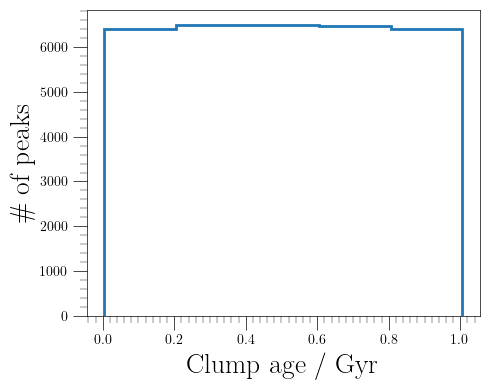

In [ ]:
plt.rcParams.update({
    'text.usetex': True,
    'font.family': 'serif',
})

f, ax = plt.subplots(figsize=(5, 4))

bins = np.arange(df_stat['peak_tage'].min(), df_stat['peak_tage'].max()+0.2, 0.2)

n, bins, patches = plt.hist(
    df_stat['peak_tage'], 
    bins, 
    histtype='step', 
    lw=2,
    ls='-',
)
# patches[0].set_xy(patches[0].get_xy()[1:])

# Add a legend and informative axis label
ax.set_xlabel('Clump age / Gyr', fontsize = 20)
ax.set_ylabel(r'\# of peaks', fontsize = 20)
# ax.set_xlim(10, 26)
# ax.set_yscale('log')

plt.setp(ax.spines.values(), linewidth=.5)
ax.tick_params('both', length=10, width=.5, which='major')
ax.tick_params('both', length=5, width=.3, which='minor')
ax.xaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(.02))
ax.yaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(200))

plt.tight_layout()

# plt.savefig('hist_redshift_clumps.pdf')

In [144]:
df_stat['peak_mass'].describe()

count    4.627300e+04
mean     2.276431e+07
std      1.482042e+07
min      7.536545e+00
25%      9.569894e+06
50%      2.170035e+07
75%      3.556340e+07
max      5.820233e+07
Name: peak_mass, dtype: float64

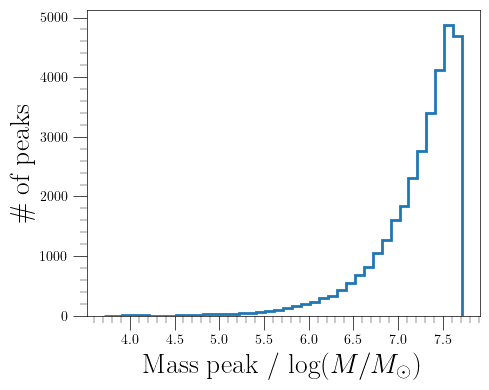

In [60]:
f, ax = plt.subplots(figsize=(5, 4))

bins = np.arange(df_stat['peak_lmass'].min(), df_stat['peak_lmass'].max()+0.1, 0.1)

n, bins, patches = plt.hist(
    df_stat['peak_lmass'], 
    bins, 
    histtype='step', 
    lw=2,
    ls='-',
)
# patches[0].set_xy(patches[0].get_xy()[1:])

# Add a legend and informative axis label
ax.set_xlabel(r'Mass peak / $\log(M/M_\odot)$', fontsize = 20)
ax.set_ylabel(r'\# of peaks', fontsize = 20)
# ax.set_xlim(10, 26)
# ax.set_yscale('log')

plt.setp(ax.spines.values(), linewidth=.5)
ax.tick_params('both', length=10, width=.5, which='major')
ax.tick_params('both', length=5, width=.3, which='minor')
ax.xaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(.1))
ax.yaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(200))

plt.tight_layout()

# plt.savefig('hist_redshift_clumps.pdf')

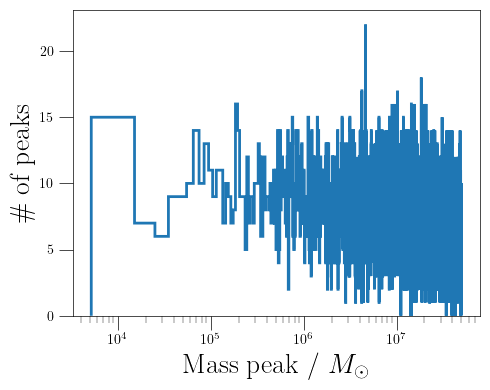

In [61]:
f, ax = plt.subplots(figsize=(5, 4))

bins = np.arange(df_stat['peak_mass'].min(), df_stat['peak_mass'].max()+1e4, 1e4)

n, bins, patches = plt.hist(
    df_stat['peak_mass'], 
    bins, 
    histtype='step', 
    lw=2,
    ls='-',
)
# patches[0].set_xy(patches[0].get_xy()[1:])

# Add a legend and informative axis label
ax.set_xlabel(r'Mass peak / $M_\odot$', fontsize = 20)
ax.set_ylabel(r'\# of peaks', fontsize = 20)
# ax.set_xlim(10, 26)
ax.set_xscale('log')

plt.setp(ax.spines.values(), linewidth=.5)
ax.tick_params('both', length=10, width=.5, which='major')
ax.tick_params('both', length=5, width=.3, which='minor')
# ax.xaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(.1))
# ax.yaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(200))

plt.tight_layout()

# plt.savefig('hist_redshift_clumps.pdf')

In [68]:
df_stat['clump_mass_ratio'].describe()

count    4.664400e+04
mean              inf
std               NaN
min     -7.519638e+00
25%     -4.655364e+00
50%     -4.195322e+00
75%     -3.620213e+00
max               inf
Name: clump_mass_ratio, dtype: float64

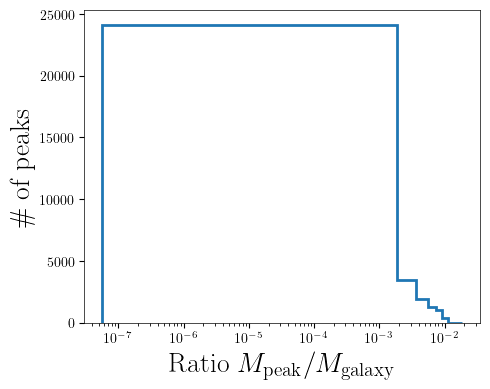

In [62]:
f, ax = plt.subplots(figsize=(5, 4))

# bins = np.arange(df_stat['clump_mass_ratio'].min(), df_stat['clump_mass_ratio'].max()+1e-5, 1e-5)

n, bins, patches = plt.hist(
    df_stat['clump_mass_ratio'].replace([np.inf, -np.inf], np.nan).dropna(),
    # bins, 
    histtype='step', 
    lw=2,
    ls='-',
)
# patches[0].set_xy(patches[0].get_xy()[1:])

# Add a legend and informative axis label
ax.set_xlabel(r'Ratio $M_{\mathrm{peak}}/M_{\mathrm{galaxy}}$', fontsize = 20)
ax.set_ylabel(r'\# of peaks', fontsize = 20)
# ax.set_xlim(10, 26)
ax.set_xscale('log')

plt.setp(ax.spines.values(), linewidth=.5)
# ax.tick_params('both', length=10, width=.5, which='major')
# ax.tick_params('both', length=5, width=.3, which='minor')
# ax.xaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(.1))
# ax.yaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(200))

plt.tight_layout()

# plt.savefig('hist_redshift_clumps.pdf')

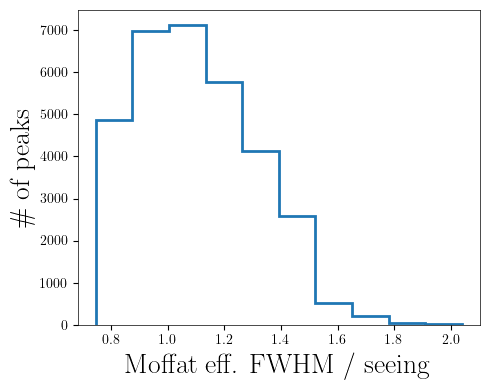

In [71]:
f, ax = plt.subplots(figsize=(5, 4))

# bins = np.arange(df_stat['clump_mass_ratio'].min(), df_stat['clump_mass_ratio'].max()+1e-5, 1e-5)

n, bins, patches = plt.hist(
    df_stat['effective_FWHM_px'] / df_stat['seeing_px'],
    # bins, 
    histtype='step', 
    lw=2,
    ls='-',
)
# patches[0].set_xy(patches[0].get_xy()[1:])

# Add a legend and informative axis label
ax.set_xlabel('Moffat eff. FWHM / seeing', fontsize = 20)
ax.set_ylabel(r'\# of peaks', fontsize = 20)
# ax.set_xlim(10, 26)
# ax.set_xscale('log')

plt.setp(ax.spines.values(), linewidth=.5)
# ax.tick_params('both', length=10, width=.5, which='major')
# ax.tick_params('both', length=5, width=.3, which='minor')
# ax.xaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(.1))
# ax.yaxis.set_minor_locator(matplotlib.ticker.MultipleLocator(200))

plt.tight_layout()

# plt.savefig('hist_redshift_clumps.pdf')

In [72]:
df_stat = (df_sims
    .groupby(['HSCobjid', 'band', 'gal_z', 'gal_mass', 'gal_sSFR', 'petroR90_r', 'clump_id'])
    .agg({
        'peak_id': 'count'
    })
    .reset_index()
    # .groupby(['HSCobjid', 'band', 'gal_z', 'gal_mass', 'gal_sSFR', 'petroR90_r', 'peak_id'])
    # .agg({
    #     'clump_id': 'count'
    # })
    # .reset_index()
    .rename(columns={
        'peak_id': 'peak_count',
        # 'clump_id': 'clump_count'
    })
)

df_stat['redshift_class'] = pd.cut(df_stat['gal_z'], bins=[-np.inf, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.4, 0.45, 0.50, np.inf])

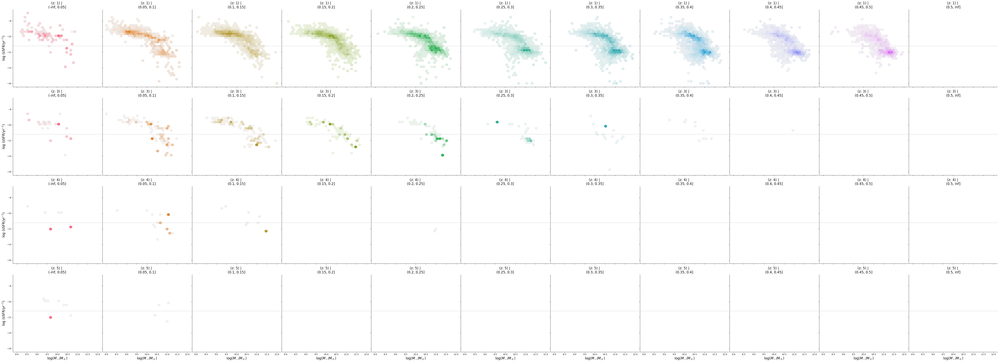

In [6]:
def hexbin(x, y, color, **kwargs):
    cmap = sns.light_palette(color, as_cmap=True)
    plt.hexbin(
        x, y, 
        gridsize=30, 
        cmap=cmap, 
        bins=20,
        mincnt=1,
        **kwargs
    )

g = sns.FacetGrid(df_stat[(df_stat['band']=='R')], hue='redshift_class', col='redshift_class', row='peak_count', height=6, aspect=1)
(g
    .map(hexbin, 'gal_mass', 'gal_sSFR', extent=[8, 12, -16, -7])
    .set_axis_labels(r'$\log (M_\star / M_\odot)$', r'$\log \,(\mathrm{sSFR} / \mathrm{yr}^{-1})$', fontsize=16)
    .set_titles(col_template='\n{col_name}', row_template='(z: {row_name})', size=16)
    .tight_layout(w_pad=0)
    .despine()
)

for ax in g.axes.flatten():
    ax.axhline(y=-11.2, color='.7', ls='--', lw=1)

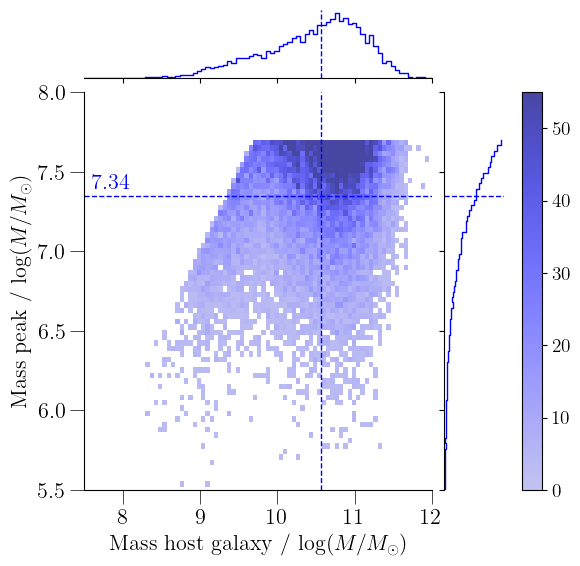

In [73]:
colour = 'blue'
_df = df_sims[(df_sims['band']=='U') & (df_sims['gal_mass']!=-9999.0)]

g = sns.jointplot(
    data=_df, 
    x='gal_mass', 
    y='peak_lmass', 
    kind='hist', 
    stat='count',
    # binwidth=(0.005, 0.05),
    pthresh=.05, 
    pmax=.8,
    cbar=True,
    color=colour,
    marginal_ticks=False,
    linewidth=1,
    cbar_kws=dict(shrink=.75, format = '%.0f'),
    marginal_kws={'element': 'step', 'lw': 1, 'fill': False}
)
model_median1 = np.nanmedian(_df['gal_mass'])
model_median2 = np.nanmedian(_df['peak_lmass'])
g.ax_marg_x.axvline(x=model_median1, linestyle='--', color=colour, lw=1)
g.ax_marg_y.axhline(y=model_median2, linestyle='--', color=colour, lw=1)
g.ax_joint.axvline(x=model_median1, linestyle='--', color=colour, lw=1)
g.ax_joint.annotate(
    '{:.2f}'.format(model_median1), 
    xy=(model_median1, 5.),
    xytext=(model_median1 + 0.07, 6.9),
    color=colour,
    fontsize=16,
)
g.ax_joint.axhline(y=model_median2, linestyle='--', color=colour, lw=1)
g.ax_joint.annotate(
    '{:.2f}'.format(model_median2), 
    xy=(7.5, model_median2),
    xytext=(7.6, model_median2 + .05),
    color=colour,
    fontsize=16,
)

# general figure settings
g.set_axis_labels(r'Mass host galaxy / $\log(M/M_\odot)$', r'Mass peak / $\log(M/M_\odot)$', fontsize=16)
g.ax_joint.xaxis.set_major_locator(MultipleLocator(1.))
g.ax_joint.yaxis.set_major_locator(MultipleLocator(.5))
g.ax_joint.tick_params('both', length=10, width=.5, which='major', labelsize=16)
g.ax_joint.tick_params('both', length=5, width=.3, which='minor', labelsize=16)

# g.ax_joint.legend(loc='upper right', fontsize = 12, labels=['GZ: Clump Scout', model_list[model_selector]], frameon=False)
# sns.move_legend(g.ax_joint, "upper left", bbox_to_anchor=(1, 1))
plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1)
# get the current positions of the joint ax and the ax for the marginal x
pos_joint_ax = g.ax_joint.get_position()
pos_marg_x_ax = g.ax_marg_x.get_position()
# reposition the joint ax so it has the same width as the marginal x ax
g.ax_joint.set_position([pos_joint_ax.x0, pos_joint_ax.y0, pos_marg_x_ax.width, pos_joint_ax.height])
# reposition the colorbar using new x positions and y positions of the joint ax
g.fig.axes[-1].set_position([.83, pos_joint_ax.y0, .07, pos_joint_ax.height])

# use matplotlib.colorbar.Colorbar object
cbar = g.ax_joint.collections[0].colorbar
cbar.ax.tick_params(labelsize=14)

plt.xlim(7.5, 12.0)
plt.ylim(5.5, 8.)
# plt.tight_layout()
plt.show(g)
# filename = ''
# g.figure.savefig(filename, bbox_inches = "tight")

In [74]:
idx_cols = ['HSCobjid', 'clump_id', 'peak_id', 'ra_centroid', 'dec_centroid', 'peak_mass', 'peak_lmass', 'peak_tage']
df_stat = (df_sims
    .pivot(index=idx_cols, columns='band', values=['flux', 'ABmag'])
    .reset_index()
)

# rename columns
suffix = '_sim_clump_'
df_stat.columns = [suffix.join(col).strip() for col in df_stat.columns.values]

cols_rename = {col_name+suffix: col_name for col_name in idx_cols}
df_stat.rename(columns=cols_rename, inplace=True)

df_stat = (df_stat
    .merge(df_galaxies, how='inner', on='HSCobjid')
    .assign(peak_U_R = lambda _df: _df.ABmag_sim_clump_U - _df.ABmag_sim_clump_R)
    .assign(gal_U_R = lambda _df: _df.u_cmodel_mag - _df.r_cmodel_mag)
)

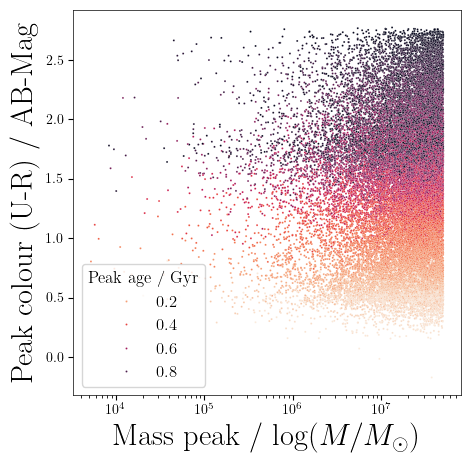

In [75]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5, 5))

palette = sns.color_palette("rocket_r", as_cmap=True)

sns.scatterplot(
    data=df_stat, 
    x='peak_mass', 
    y='peak_U_R', 
    hue='peak_tage',
    palette=palette,
    s=2,
    markers='x'
)

# Add a legend and informative axis label
plt.setp(ax.spines.values(), linewidth=.5)
# ax.set_title('', fontsize = 22)
ax.legend(ncol=1, loc='lower left', title='Peak age / Gyr', frameon=True, title_fontsize=12, fontsize = 12)
ax.set_xlabel(r'Mass peak / $\log(M/M_\odot)$', fontsize = 22)
ax.set_ylabel('Peak colour (U-R) / AB-Mag', fontsize = 22)
ax.set_xscale('log')
# ax.set_xlim(-2, 3)
# ax.set_ylim(-2, 3)
# ax.tick_params('both', length=10, width=.5, which='major')
# ax.tick_params('both', length=5, width=.3, which='minor')
# ax.yaxis.set_minor_locator(MultipleLocator(.2))
# ax.xaxis.set_minor_locator(MultipleLocator(.2))

plt.show(g)

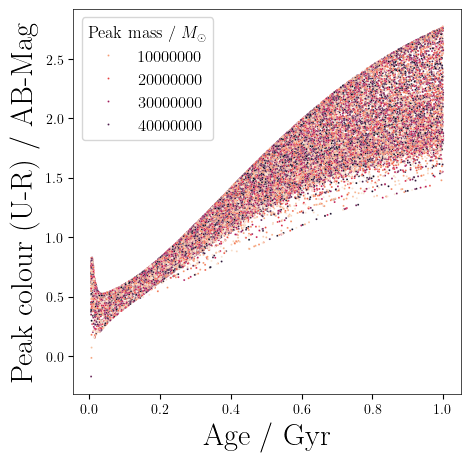

In [76]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5, 5))

palette = sns.color_palette("rocket_r", as_cmap=True)

sns.scatterplot(
    data=df_stat, 
    x='peak_tage', 
    y='peak_U_R', 
    hue='peak_mass',
    palette=palette,
    s=2,
    markers='x'
)

# Add a legend and informative axis label
plt.setp(ax.spines.values(), linewidth=.5)
# ax.set_title('', fontsize = 22)
ax.legend(ncol=1, loc='upper left', title=r'Peak mass / $M_\odot$', frameon=True, title_fontsize=12, fontsize = 12)
ax.set_xlabel('Age / Gyr', fontsize = 22)
ax.set_ylabel('Peak colour (U-R) / AB-Mag', fontsize = 22)
# ax.set_xscale('log')
# ax.set_xlim(-2, 3)
# ax.set_ylim(-2, 3)
# ax.tick_params('both', length=10, width=.5, which='major')
# ax.tick_params('both', length=5, width=.3, which='minor')
# ax.yaxis.set_minor_locator(MultipleLocator(.2))
# ax.xaxis.set_minor_locator(MultipleLocator(.2))

plt.show(g)

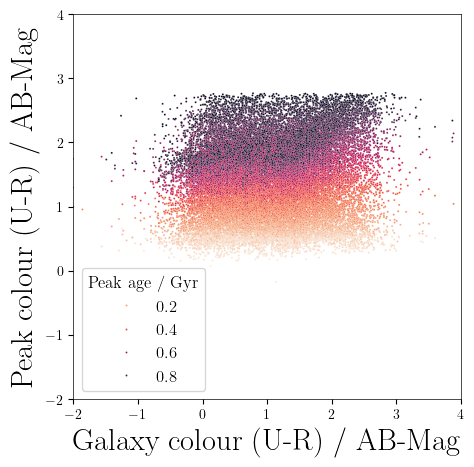

In [77]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5, 5))

palette = sns.color_palette("rocket_r", as_cmap=True)

sns.scatterplot(
    data=df_stat, 
    x='gal_U_R', 
    y='peak_U_R', 
    hue='peak_tage',
    palette=palette,
    s=2,
    markers='x'
)

# Add a legend and informative axis label
plt.setp(ax.spines.values(), linewidth=.5)
# ax.set_title('', fontsize = 22)
ax.legend(ncol=1, loc='lower left', title='Peak age / Gyr', frameon=True, title_fontsize=12, fontsize = 12)
ax.set_xlabel('Galaxy colour (U-R) / AB-Mag', fontsize = 22)
ax.set_ylabel('Peak colour (U-R) / AB-Mag', fontsize = 22)
ax.set_xlim(-2, 4)
ax.set_ylim(-2, 4)
# ax.tick_params('both', length=10, width=.5, which='major')
# ax.tick_params('both', length=5, width=.3, which='minor')
# ax.yaxis.set_minor_locator(MultipleLocator(.2))
# ax.xaxis.set_minor_locator(MultipleLocator(.2))

plt.show(g)

## Create new FITS-files with simulated clump images and noise

In [6]:
# create folder structure for PNGs/FITS
sub_folder_list = ['{:03d}'.format(last_digit) for last_digit in range(0, 1000, 1)]

for sub_folder in sub_folder_list:
    os.mkdir(FITS_FILE_OUT_PATH + sub_folder)

In [5]:
df_simulated_peaks = pd.read_parquet(PREDICTIONS_FILE_PATH + 'simulated_peaks_CLAUDS+HSC_bands.gzip', engine='pyarrow')

In [18]:
df_simulated_peaks[['HSCobjid', 'seeing_px', 'band']]

,HSCobjid,seeing_px,band
0,42094832734194278,5.583333,U
1,42094832734194278,4.422816,G
2,42094832734194278,5.109677,R
3,42094832734194278,3.686265,I
4,42094832734194278,3.687697,Z
...,...,...,...
1705,42090026665789815,4.591131,G
1706,42090026665789815,4.382590,R
1707,42090026665789815,3.590315,I
1708,42090026665789815,4.479401,Z


In [20]:
bands = 'UGRIZY'

for objid in tqdm(df_simulated_peaks['HSCobjid'].unique()):
    for i, band in enumerate(bands):
        if band=='U':
            _fits_file = FITS_FILE_PATH + str(objid)[-3:] + '/' + str(objid) + '_CLAUDS-U.fits'
            # _psf_file =  PSF_FILE_PATH  + str(objid)[-3:] + '/' + str(objid) + '_PSF_CLAUDS-U.fits'
            _fits_file_out = FITS_FILE_OUT_PATH + str(objid)[-3:] + '/' + str(objid) + '_CLAUDS-U.fits'
        else:
            _fits_file = FITS_FILE_PATH + str(objid)[-3:] + '/' + str(objid) + '_HSC-{}_var.fits'.format(band)
            _fits_file_out = FITS_FILE_OUT_PATH + str(objid)[-3:] + '/' + str(objid) + '_HSC-{}_var.fits'.format(band)
            # _psf_file =  PSF_FILE_PATH  + str(objid)[-3:] + '/' + str(objid) + '_PSF_HSC-{}.fits'.format(band)
        _ff = fits.open(_fits_file)
        # _psf = fits.open(_psf_file)

        hsc_header = _ff[1].header.copy()
        xmax, ymax = _ff[1].data.shape
        
        # sim_clump_data = ff[band].copy()
        sim_clump_data = np.zeros_like(_ff[1].data)
        
        for idx, row in df_simulated_peaks[(df_simulated_peaks['HSCobjid']==objid)].query('band==@band').iterrows():
            model = MoffatPSF(
                flux=row['flux'], 
                x_0=row['x_centroid'] + row['moffat_x_0'],
                y_0=row['y_centroid'] + row['moffat_x_0'],
                alpha=row['moffat_alpha'], 
                beta=row['moffat_beta']
            )
            yy, xx = np.mgrid[0:xmax, 0:ymax]
            sim_clump_data += model(xx, yy)
        
        # convolve with image PSF
        seeing = df_simulated_peaks[(df_simulated_peaks['HSCobjid']==objid)].query('band==@band')['seeing_px'].iloc[0]
        kernel = Gaussian2DKernel(gaussian_fwhm_to_sigma*seeing)
        # sim_clump_data = convolve(sim_clump_data, _psf[0].data)
        sim_clump_data = convolve_fft(sim_clump_data, kernel, boundary='wrap')

        # add random noise to image with simulated peaks
        noise_image = generate_read_noise(sim_clump_data, np.std(sim_clump_data))

        # create new FITS
        hdr = _ff[0].header
        empty_primary = fits.PrimaryHDU(header=hdr)
    
        image_hdu1 = fits.ImageHDU(_ff[1].data)
        image_hdu2 = fits.ImageHDU(_ff[2].data)
        image_hdu3 = fits.ImageHDU(_ff[3].data)
        image_hdu4 = fits.ImageHDU(sim_clump_data)
        image_hdu5 = fits.ImageHDU(noise_image)
    
        hdul = fits.HDUList([empty_primary, image_hdu1, image_hdu2, image_hdu3, image_hdu4, image_hdu5])
    
        # Update the FITS headers
        hdul[1].header = _ff[1].header.copy()
        hdul[2].header = _ff[1].header.copy()
        hdul[3].header = _ff[1].header.copy()
        hdul[4].header = _ff[1].header.copy()
        hdul[4].header['EXTTYPE'] = 'SIMCLUMPS' 
        hdul[5].header = _ff[1].header.copy()
        hdul[5].header['EXTTYPE'] = 'SIMCLUMPNOISE'
    
        # Write the cutout to a new FITS file
        hdul.writeto(_fits_file_out, overwrite=True)

        _ff.close()

100%|██████████| 13789/13789 [47:03<00:00,  4.88it/s] 


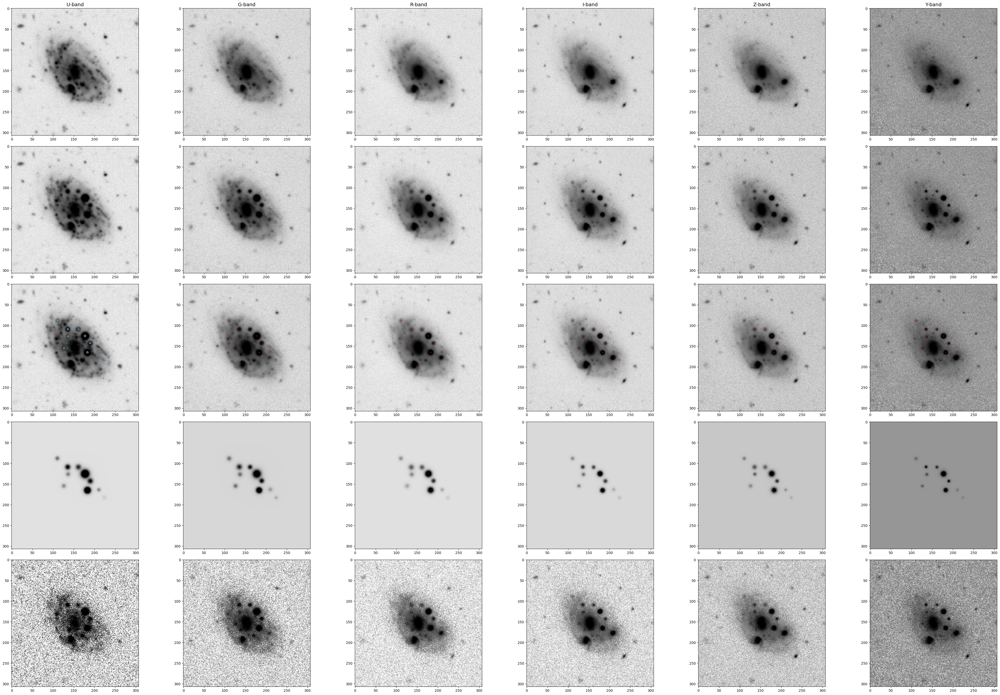

In [21]:
box_colour = {
    1 : 'lightgreen',
    2 : 'r',
    3 : 'yellow',
    4 : 'blue',
    5 : 'cyan',
}
peak_colour = {
    'U' : 'blue',
    'G' : 'g',
    'R' : 'r',
    'I' : 'darkred',
    'Z' : 'dodgerblue',
    'Y' : 'cyan',
}

objid = 44218376234488599

ff = {}
bands = 'UGRIZY'
sim_clumps = {}
noise_image = {}

fig, ax = plt.subplots(
    nrows=5, ncols=6, 
    figsize=(7*6,7*4),
    # sharex=True, 
    # sharey=True
)

for i, band in enumerate(bands):
    if band=='U':
        _fits_file = FITS_FILE_OUT_PATH + str(objid)[-3:] + '/' + str(objid) + '_CLAUDS-U.fits'
    else:
        _fits_file = FITS_FILE_OUT_PATH + str(objid)[-3:] + '/' + str(objid) + '_HSC-{}_var.fits'.format(band)
    _ff = fits.open(_fits_file)
    ff[band] = _ff[1].data
    sim_clumps[band] = _ff[4].data
    noise_image[band] = _ff[5].data
    _ff.close()

    ax[0,i].set_title('{}-band'.format(band), fontsize = 14)
    # norm = ImageNormalize(ff[band], stretch=LinearStretch())
    # norm = ImageNormalize(ff[band], stretch=LogStretch())
    p = np.percentile(ff[band].flatten(), 99.5)
    norm = ImageNormalize(ff[band], vmax=p, stretch=AsinhStretch())
    ax[0,i].imshow(ff[band], cmap='Greys', norm=norm)
    ax[1,i].imshow(ff[band] + sim_clumps[band], cmap='Greys', norm=norm)
    ax[2,i].imshow(ff[band] + sim_clumps[band], cmap='Greys', norm=norm)
    ax[3,i].imshow(sim_clumps[band], cmap='Greys', norm=norm)
    ax[4,i].imshow(ff[band] + sim_clumps[band] + noise_image[band], cmap='Greys', norm=norm)

    if band == 'U':
        for idx, dat in df_simulated_peaks[(df_simulated_peaks['HSCobjid']==objid)].iterrows():
            circ = matplotlib.patches.Circle(
                (dat['x_centroid'], dat['y_centroid']),
                dat['seeing_px']/2,
                facecolor='None', 
                edgecolor=peak_colour[dat['band']],
            )
            ax[2,i].add_patch(circ)
    else:
        pt_x = df_simulated_peaks[(df_simulated_peaks['HSCobjid']==objid) & (df_simulated_peaks['band']==band)]['x_centroid'].values
        pt_y = df_simulated_peaks[(df_simulated_peaks['HSCobjid']==objid) & (df_simulated_peaks['band']==band)]['y_centroid'].values
        ax[2,i].scatter(
            pt_x, pt_y,
            c='r',
            marker='+',
            linewidths=0.5
        )

plt.tight_layout()